# Nanda restricted / excluded loss — all optimizers overlay

Two panels, **one curve per optimizer config** (= mean across 5 seeds) :
1. **Restricted loss** = `restricted_loss_all` (key-freq projection, evaluated on full `p×p` grid)
2. **Excluded loss**   = `excluded_all_loss_train` (key freqs subtracted, evaluated on TRAIN only)

Both keys follow the strict Nanda 2023 convention (`progress-measures-paper/Grokking_Analysis.ipynb`,
cells 61 `calculate_excluded_loss_2D_full` and 66 `trig_loss`).

For **EGD m=0 fast** and **Muon m=0 fast** we read from `runs/phase2_v2_flexkf/` (cum-energy τ=0.90 key freqs).
All other configs are read from `runs/phase2_optim/{config}_fixedkf/` (top-k=5 key freqs).

In [11]:
from pathlib import Path

import numpy as np
import matplotlib.pyplot as plt

from viz_analysis import load_seeds, stack_fourier

SEEDS = [0, 1, 2, 3, 4]

In [12]:
# (label, save_root, color)
# v2 flex dirs are used only where they exist (egd_m0_fast, muon_m0_fast).
CONFIGS = [
    ('AdamW fast',         'runs/phase2_optim/adamw_fast_fixedkf',          '#1f77b4'),
    ('AdamW slow',         'runs/phase2_optim/adamw_slow_fixedkf',          '#0b3d61'),
    ('EGD m=0 fast (flex)', 'runs/phase2_v2_flexkf/egd_m0_fast',            '#2ca02c'),
    ('EGD m=0 slow',       'runs/phase2_optim/egd_m0_slow_fixedkf',         '#155d27'),
    ('EGD m=0.9 fast',     'runs/phase2_optim/egd_m0.9_fast_fixedkf',       '#98df8a'),
    ('EGD m=0.9 slow',     'runs/phase2_optim/egd_m0.9_slow_fixedkf',       '#5fb04c'),
    ('Muon m=0 fast (flex)','runs/phase2_v2_flexkf/muon_m0_fast',           '#ff7f0e'),
    ('Muon m=0 slow',      'runs/phase2_optim/muon_m0_slow_fixedkf',        '#8a3b00'),
    ('Muon m=0.95 fast',   'runs/phase2_optim/muon_m0.95_fast_fixedkf',     '#d62728'),
    ('Muon m=0.95 slow',   'runs/phase2_optim/muon_m0.95_slow_fixedkf',     '#6a0a0a'),
]

RESTRICTED_KEY = 'restricted_loss_all'        # Nanda: full p*p grid
EXCLUDED_KEY   = 'excluded_all_loss_train'    # Nanda: train indices only

In [13]:
def mean_curve(save_root, seeds, key):
    """Return (epoch_grid, mean_curve) averaged across seeds via nanmean.

    Uses `stack_fourier` which interpolates per-seed Fourier curves onto the
    union epoch grid (handles per-seed adaptive_logging schedules).
    """
    if not Path(save_root).exists():
        print(f'  ! missing dir: {save_root}')
        return None, None
    runs, _ = load_seeds(save_root, seeds)
    if not runs:
        print(f'  ! no seeds loaded from {save_root}')
        return None, None
    eps, stk = stack_fourier(runs, key)
    if eps is None:
        print(f'  ! no Fourier snapshots for key {key!r} in {save_root}')
        return None, None
    with np.errstate(all='ignore'):
        mean = np.nanmean(stk, axis=0)
    return eps, mean


data = {}
for label, root, color in CONFIGS:
    print(f'Loading {label}  ({root})')
    eps_r, m_r = mean_curve(root, SEEDS, RESTRICTED_KEY)
    eps_e, m_e = mean_curve(root, SEEDS, EXCLUDED_KEY)
    data[label] = {
        'color':      color,
        'restricted': (eps_r, m_r),
        'excluded':   (eps_e, m_e),
    }
print('done.')

Loading AdamW fast  (runs/phase2_optim/adamw_fast_fixedkf)
Loading AdamW slow  (runs/phase2_optim/adamw_slow_fixedkf)
Loading EGD m=0 fast (flex)  (runs/phase2_v2_flexkf/egd_m0_fast)
Loading EGD m=0 slow  (runs/phase2_optim/egd_m0_slow_fixedkf)
Loading EGD m=0.9 fast  (runs/phase2_optim/egd_m0.9_fast_fixedkf)
Loading EGD m=0.9 slow  (runs/phase2_optim/egd_m0.9_slow_fixedkf)
Loading Muon m=0 fast (flex)  (runs/phase2_v2_flexkf/muon_m0_fast)
Loading Muon m=0 slow  (runs/phase2_optim/muon_m0_slow_fixedkf)
Loading Muon m=0.95 fast  (runs/phase2_optim/muon_m0.95_fast_fixedkf)
Loading Muon m=0.95 slow  (runs/phase2_optim/muon_m0.95_slow_fixedkf)
done.


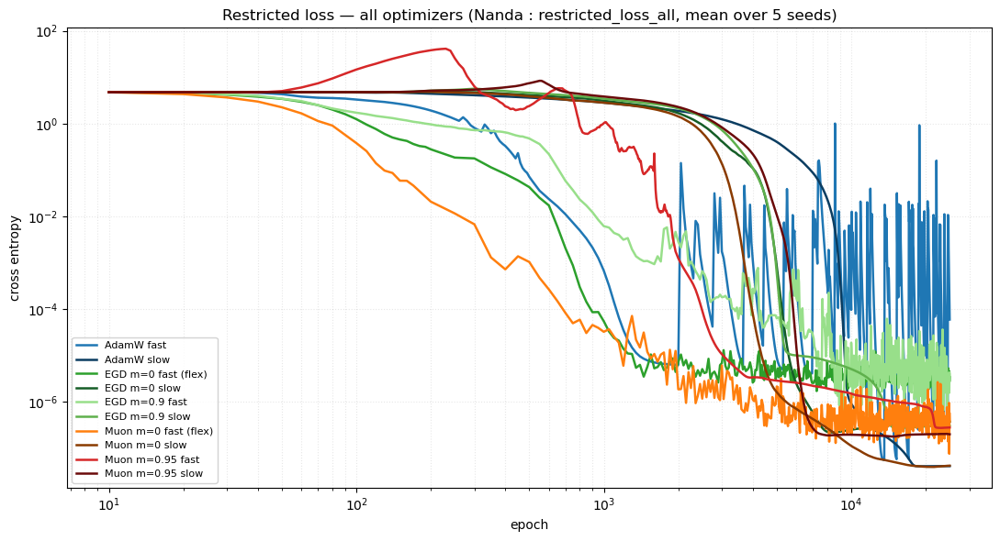

In [14]:
def _overlay(ax, kind, ylabel, title):
    for label, root, color in CONFIGS:
        eps, m = data[label][kind]
        if eps is None:
            continue
        keep = eps >= 1                       # avoid epoch=0 on log scale
        ax.plot(eps[keep], m[keep], color=color, lw=1.8, label=label)
    ax.set_xscale('log'); ax.set_yscale('log')
    ax.set_xlabel('epoch'); ax.set_ylabel(ylabel)
    ax.set_title(title)
    ax.grid(True, which='both', alpha=0.3, linestyle=':')
    ax.legend(loc='best', fontsize=8, framealpha=0.85)


FIGS_DIR = Path('figs_phase2_optim')
FIGS_DIR.mkdir(exist_ok=True)

fig, ax = plt.subplots(figsize=(11, 6))
_overlay(ax, 'restricted', 'cross entropy',
         f'Restricted loss — all optimizers (Nanda : {RESTRICTED_KEY}, mean over {len(SEEDS)} seeds)')
plt.tight_layout()
plt.savefig(FIGS_DIR / 'nanda_restricted_loss_all_optimizers.png',
            bbox_inches='tight', facecolor='white', dpi=140)
plt.show()

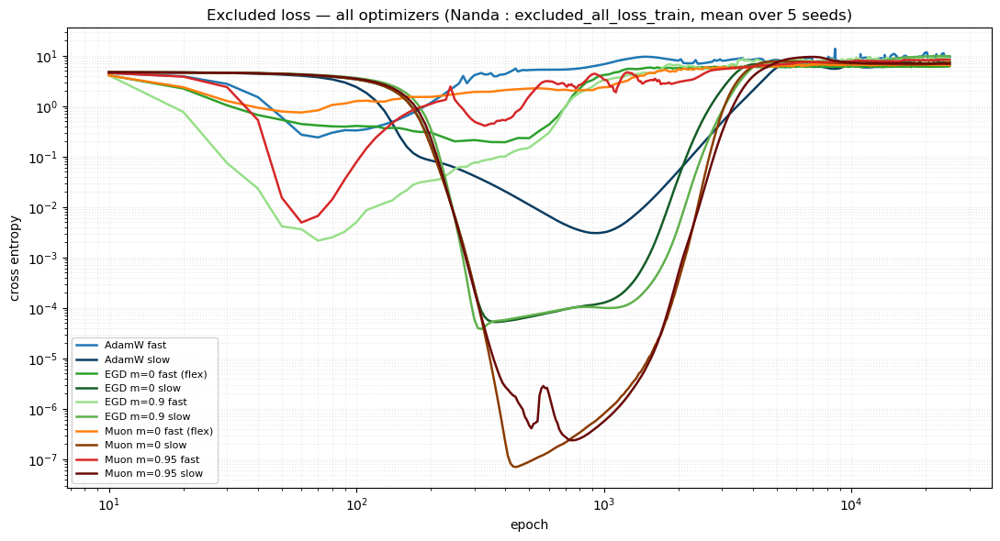

In [15]:
fig, ax = plt.subplots(figsize=(11, 6))
_overlay(ax, 'excluded', 'cross entropy',
         f'Excluded loss — all optimizers (Nanda : {EXCLUDED_KEY}, mean over {len(SEEDS)} seeds)')
plt.tight_layout()
plt.savefig(FIGS_DIR / 'nanda_excluded_loss_all_optimizers.png',
            bbox_inches='tight', facecolor='white', dpi=140)
plt.show()

## Pairwise comparisons — all C(10,2) = 45 pairs

For each pair of optimizer configs, a 2-panel figure (restricted | excluded) with the
standard multi-seed style :

- **bold curve** = mean across the 5 seeds
- thin transparent lines = per-seed trajectories
- shaded envelope = min/max across seeds

Each figure is saved to `figs_phase2_optim/pair_comparisons/`. Set `SHOW_INLINE = False`
in the loop cell if you only want the files on disk.

In [16]:
from viz_analysis import _plot_band

def load_stacks(save_root, seeds, key):
    if not Path(save_root).exists():
        return None, None
    runs, _ = load_seeds(save_root, seeds)
    if not runs:
        return None, None
    return stack_fourier(runs, key)


stacks = {}
for label, root, color in CONFIGS:
    eps_r, stk_r = load_stacks(root, SEEDS, RESTRICTED_KEY)
    eps_e, stk_e = load_stacks(root, SEEDS, EXCLUDED_KEY)
    stacks[label] = {
        'color':      color,
        'restricted': (eps_r, stk_r),
        'excluded':   (eps_e, stk_e),
    }
print(f'loaded full stacks for {len(stacks)} configs')

loaded full stacks for 10 configs


In [17]:
def pair_plot(label_a, label_b, *, save_path=None, show=True):
    """2-panel figure (restricted | excluded) comparing 2 configs in multi-seed band style."""
    da, db = stacks[label_a], stacks[label_b]

    fig, axes = plt.subplots(1, 2, figsize=(13.5, 5))

    for ax, kind, key_name, title in [
        (axes[0], 'restricted', RESTRICTED_KEY, f'Restricted loss  ({RESTRICTED_KEY})'),
        (axes[1], 'excluded',   EXCLUDED_KEY,   f'Excluded loss  ({EXCLUDED_KEY})'),
    ]:
        for d, label in [(da, label_a), (db, label_b)]:
            eps, stk = d[kind]
            if eps is None or stk is None:
                continue
            keep = eps >= 1
            _plot_band(ax, eps[keep], stk[:, keep], d['color'], label=label)
        ax.set_xscale('log'); ax.set_yscale('log')
        ax.set_xlabel('epoch'); ax.set_ylabel('cross entropy')
        ax.set_title(title)
        ax.grid(True, which='both', alpha=0.3, linestyle=':')
        ax.legend(loc='best', fontsize=9, framealpha=0.85)

    fig.suptitle(f'{label_a}   vs   {label_b}'
                 f'   ·   bold = mean across {len(SEEDS)} seeds, thin = per-seed, band = min-max',
                 y=1.02, fontsize=11, fontweight='600')
    plt.tight_layout()
    if save_path is not None:
        plt.savefig(save_path, bbox_inches='tight', facecolor='white', dpi=130)
    if show:
        plt.show()
    else:
        plt.close(fig)

45 pairs to plot


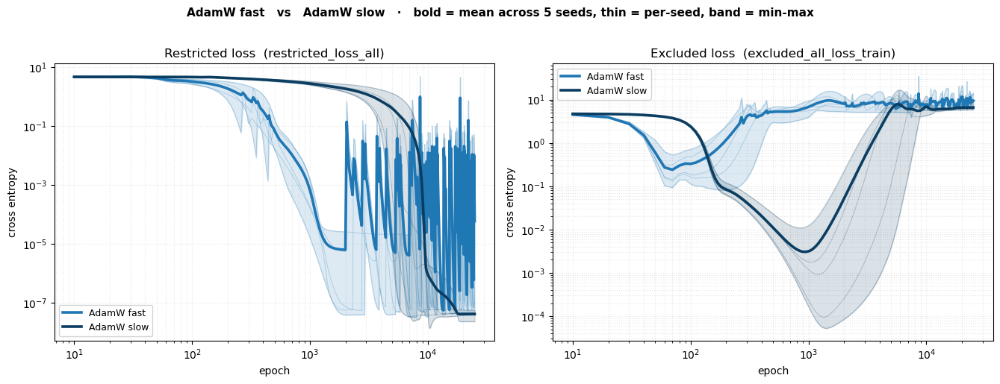

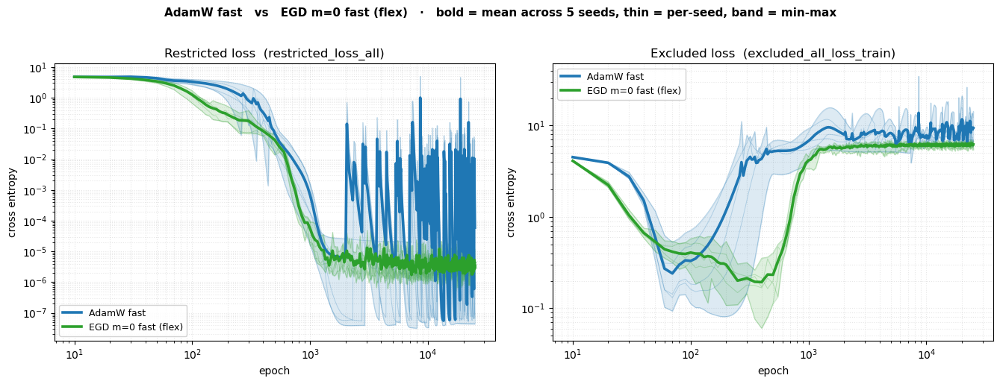

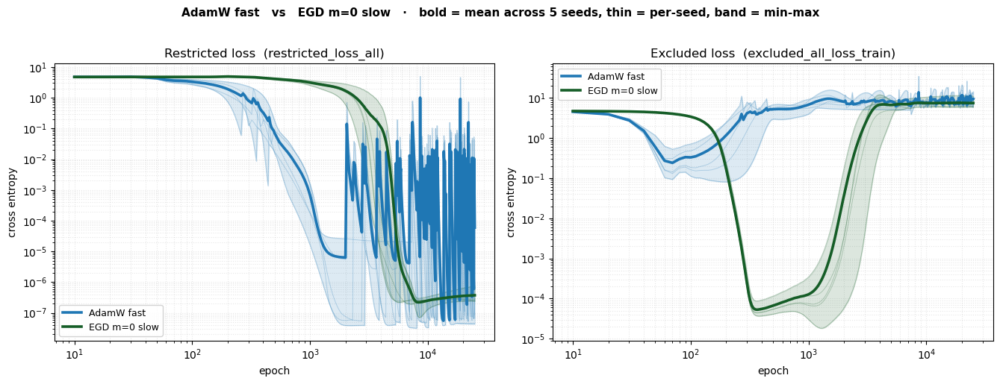

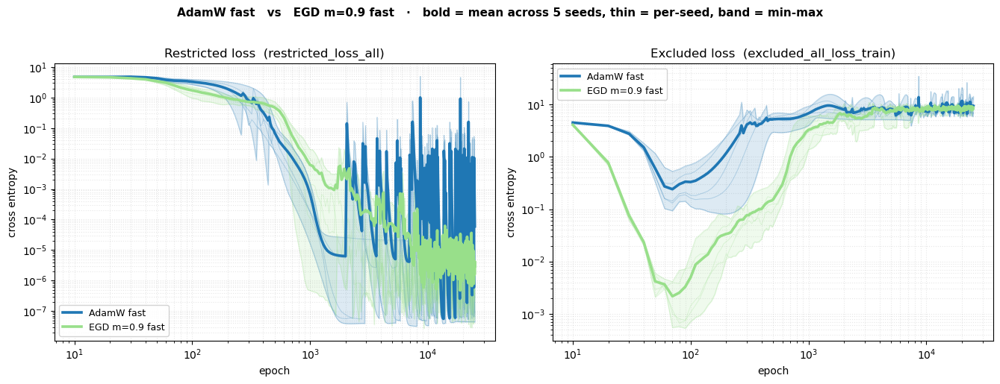

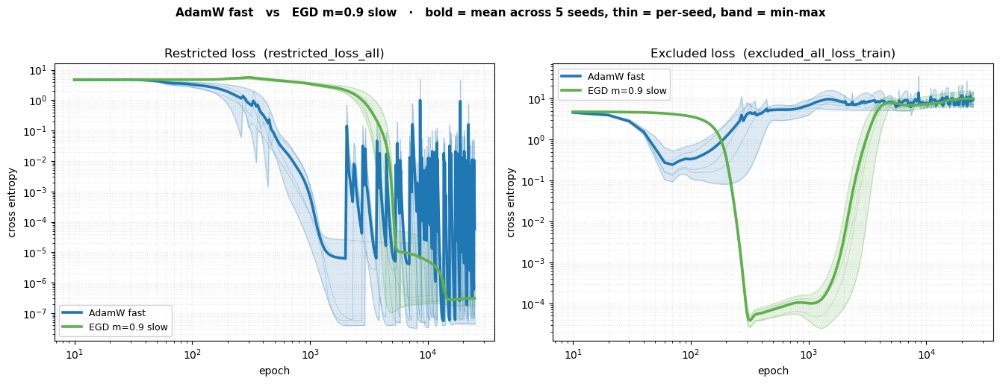

...

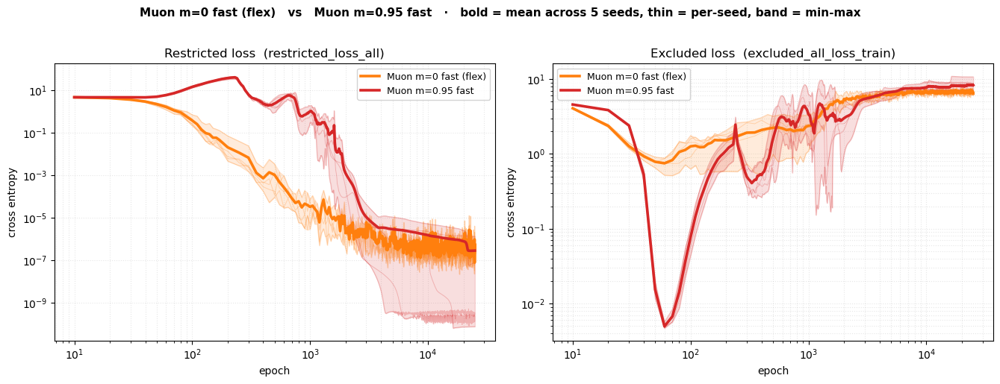

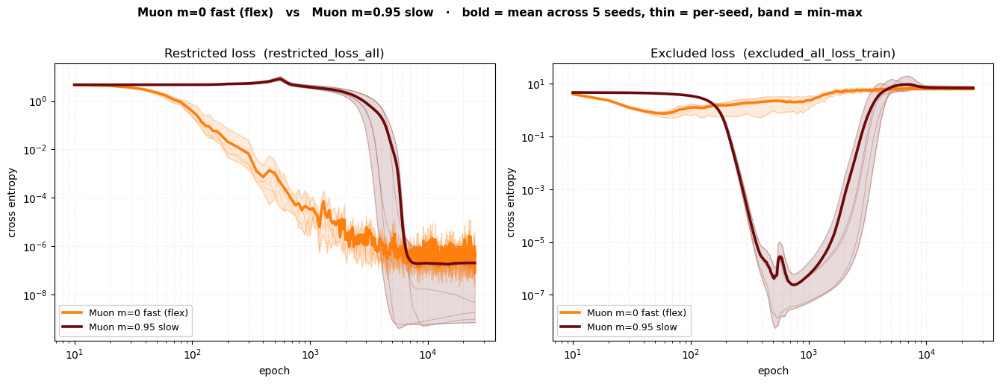

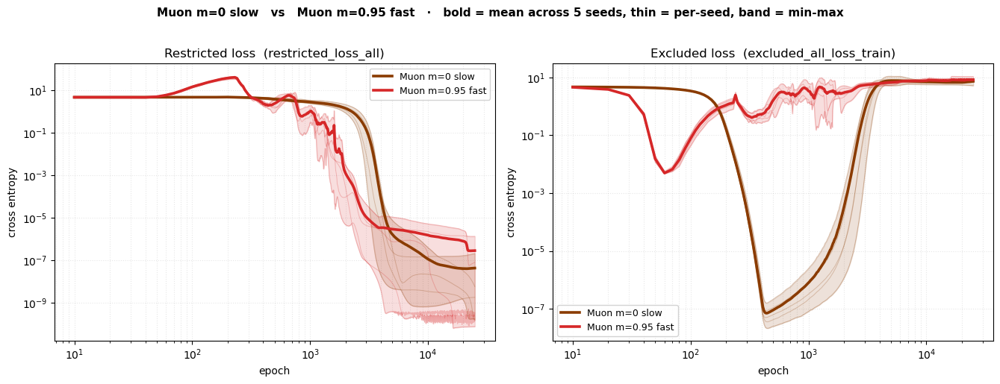

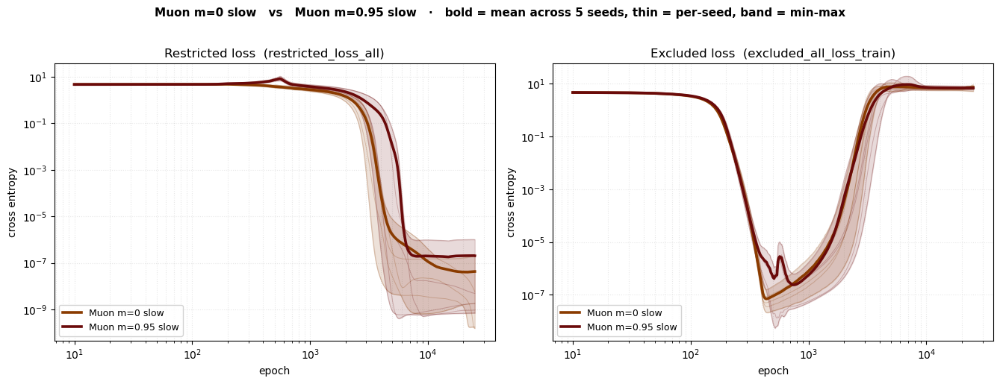

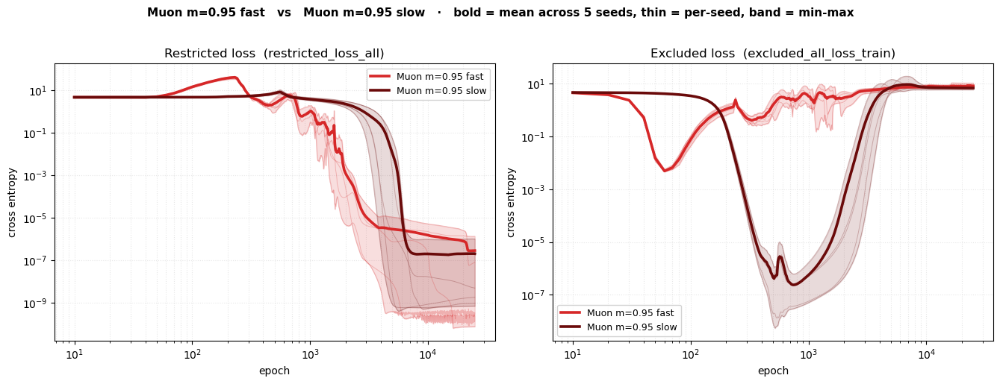


All 45 pair plots saved to figs_phase2_optim/pair_comparisons/


In [18]:
from itertools import combinations
import re

PAIR_DIR = Path('figs_phase2_optim/pair_comparisons')
PAIR_DIR.mkdir(parents=True, exist_ok=True)

SHOW_INLINE = True   # set False to only save PNGs without rendering 45 figures inline

def slug(s):
    return re.sub(r'[^a-z0-9]+', '_', s.lower()).strip('_')

labels = [lab for lab, _, _ in CONFIGS]
PAIRS = list(combinations(labels, 2))
print(f'{len(PAIRS)} pairs to plot')

for a, b in PAIRS:
    sp = PAIR_DIR / f'pair_{slug(a)}__vs__{slug(b)}.png'
    pair_plot(a, b, save_path=sp, show=SHOW_INLINE)

print(f'\nAll {len(PAIRS)} pair plots saved to {PAIR_DIR}/')